In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import math 
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
def multiple_histogram(data):
    
    num_row = math.ceil(len(data.columns) / 3)
    fig = make_subplots(rows=num_row, cols=3,subplot_titles=(df.columns))

    place_col = 1
    place_row = 1
    for i in data.columns:

        fig.add_trace(go.Histogram(x=data[i]),row=place_row, col=place_col)

        place_col += 1
        if place_col == 4:
            place_col = 1
            place_row += 1
    return fig.update_layout(height=1600, width=1100,
                          title_text="Multiple Histogram for all featrues")



def multiple_boxplot(data):
    
    num_row = math.ceil(len(data.columns) / 3)
    fig = make_subplots(rows=num_row, cols=3,subplot_titles=(df.columns))

    place_col = 1
    place_row = 1
    for i in data.columns:

        fig.add_trace(go.Box(y=data[i]),row=place_row, col=place_col)

        place_col += 1
        if place_col == 4:
            place_col = 1
            place_row += 1
    return fig.update_layout(height=1600, width=1100,
                          title_text="Multiple Histogram for all featrues")

def check_nulls(X_data):
    
    unusual_nulls = X_data[X_data.isin(['{}','[]', "?", ".", "-", "_", "", " ", "  "])].sum()

    nulls_df = pd.concat([X_data.isna().sum(), unusual_nulls], axis=1)
    nulls_df.columns = ["usual_nulls", "strange_nulls"]
    nulls_df = nulls_df.sort_values('usual_nulls', ascending = False)
    return nulls_df

########################################################




In [3]:
df= pd.read_csv('Sales data.csv.zip')
df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,9796,CA-2017-125920,21/05/2017,28/05/2017,Standard Class,SH-19975,Sally Hughsby,Corporate,United States,Chicago,Illinois,60610.0,Central,OFF-BI-10003429,Office Supplies,Binders,"Cardinal HOLDit! Binder Insert Strips,Extra St...",3.7980
9796,9797,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,OFF-AR-10001374,Office Supplies,Art,"BIC Brite Liner Highlighters, Chisel Tip",10.3680
9797,9798,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10004977,Technology,Phones,GE 30524EE4,235.1880
9798,9799,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10000912,Technology,Phones,Anker 24W Portable Micro USB Car Charger,26.3760


In [4]:
df.head(10)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680
5,6,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.0,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.8600
6,7,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.0,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.2800
7,8,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.0,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.1520
8,9,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.0,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by S...,18.5040
9,10,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.0,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9800 non-null   int64  
 1   Order ID       9800 non-null   object 
 2   Order Date     9800 non-null   object 
 3   Ship Date      9800 non-null   object 
 4   Ship Mode      9800 non-null   object 
 5   Customer ID    9800 non-null   object 
 6   Customer Name  9800 non-null   object 
 7   Segment        9800 non-null   object 
 8   Country        9800 non-null   object 
 9   City           9800 non-null   object 
 10  State          9800 non-null   object 
 11  Postal Code    9789 non-null   float64
 12  Region         9800 non-null   object 
 13  Product ID     9800 non-null   object 
 14  Category       9800 non-null   object 
 15  Sub-Category   9800 non-null   object 
 16  Product Name   9800 non-null   object 
 17  Sales          9800 non-null   float64
dtypes: float

In [6]:
df.describe()

,Row ID,Postal Code,Sales
count,9800.000000,9789.000000,9800.000000
mean,4900.500000,55273.322403,230.769059
std,2829.160653,32041.223413,626.651875
min,1.000000,1040.000000,0.444000
25%,2450.750000,23223.000000,17.248000
50%,4900.500000,58103.000000,54.490000
75%,7350.250000,90008.000000,210.605000
max,9800.000000,99301.000000,22638.480000


In [7]:
df=df.drop(columns=['Customer Name'])

In [8]:
df.shape

(9800, 17)

In [9]:
df=df.drop_duplicates()

In [10]:
df[df.duplicated()]

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales


In [11]:
df.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Segment          0
Country          0
City             0
State            0
Postal Code     11
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
dtype: int64

In [12]:
df['Postal Code'].fillna(df['Postal Code'].mode()[0], inplace=True)
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9800 entries, 0 to 9799
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9800 non-null   int64  
 1   Order ID      9800 non-null   object 
 2   Order Date    9800 non-null   object 
 3   Ship Date     9800 non-null   object 
 4   Ship Mode     9800 non-null   object 
 5   Customer ID   9800 non-null   object 
 6   Segment       9800 non-null   object 
 7   Country       9800 non-null   object 
 8   City          9800 non-null   object 
 9   State         9800 non-null   object 
 10  Postal Code   9800 non-null   float64
 11  Region        9800 non-null   object 
 12  Product ID    9800 non-null   object 
 13  Category      9800 non-null   object 
 14  Sub-Category  9800 non-null   object 
 15  Product Name  9800 non-null   object 
 16  Sales         9800 non-null   float64
dtypes: float64(2), int64(1), object(14)
memory usage: 1.3+ MB


In [14]:
check_nulls(df)

,usual_nulls,strange_nulls
Row ID,0,0.0
State,0,0
Product Name,0,0
Sub-Category,0,0
Category,0,0
Product ID,0,0
Region,0,0
Postal Code,0,0.0
City,0,0
Order ID,0,0


# EDA

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\2869816972.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True,linewidths=0.1);


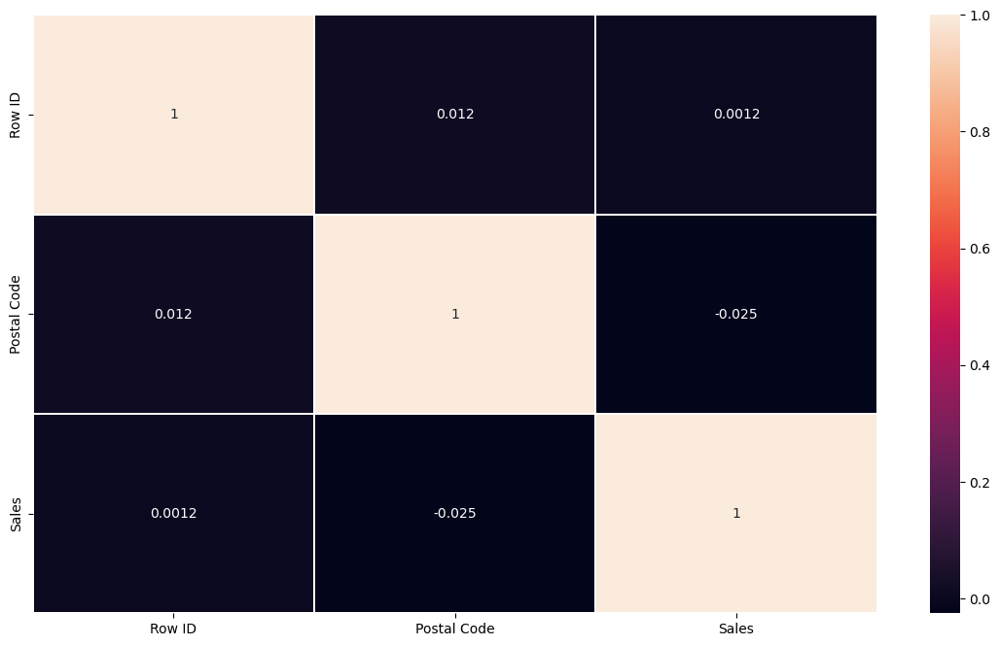

In [15]:
plt.figure(figsize = (14,8))
sns.heatmap(df.corr(),annot=True,linewidths=0.1);

In [16]:
multiple_histogram(df)

In [17]:
round(df['Category'].value_counts()/ df.shape[0]*100,1)

Office Supplies    60.3
Furniture          21.2
Technology         18.5
Name: Category, dtype: float64

In [18]:
labels = df.Category.unique()
values = df['Category'].value_counts()
fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

In [19]:
df.head(10)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680
5,6,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Consumer,United States,Los Angeles,California,90032.0,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.8600
6,7,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Consumer,United States,Los Angeles,California,90032.0,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.2800
7,8,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Consumer,United States,Los Angeles,California,90032.0,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.1520
8,9,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Consumer,United States,Los Angeles,California,90032.0,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by S...,18.5040
9,10,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Consumer,United States,Los Angeles,California,90032.0,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9000


In [20]:
import plotly.express as px 
fig = px.sunburst(data_frame = df[['Category','Sub-Category','Row ID']].groupby(['Category','Sub-Category']).sum().reset_index()
, path=['Category', 'Sub-Category'], values='Row ID', title='Frequency of category occurences.'
,color_discrete_sequence=px.colors.sequential.Electric)
fig.show()

In [21]:
fig = px.sunburst(data_frame = df[['Region','City','Row ID']].groupby(['Region','City']).sum().reset_index(), path=['Region', 'City'], values='Row ID', title='Frequency of regions and cities occurences.',color_discrete_sequence=px.colors.sequential.thermal)
fig.show()

In [22]:
df.columns


Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales'],
      dtype='object')

In [23]:
round(df.groupby(df['City']).sum()['Sales'])/len(df)*100,2

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\2703570310.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



(City
 Aberdeen        0.265306
 Abilene         0.010204
 Akron          27.795918
 Albuquerque    22.653061
 Alexandria     56.326531
                  ...    
 Woonsocket      2.000000
 Yonkers        78.142857
 York            8.346939
 Yucaipa         0.520408
 Yuma            8.581633
 Name: Sales, Length: 529, dtype: float64,
 2)

In [24]:
df['Ship Mode'].value_counts()

Standard Class    5859
Second Class      1902
First Class       1501
Same Day           538
Name: Ship Mode, dtype: int64

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1219155660.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<Axes: xlabel='Ship Mode'>

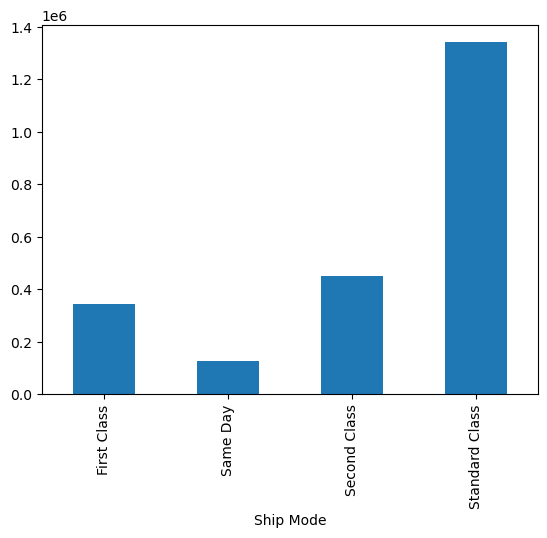

In [25]:
df.groupby(['Ship Mode']).sum()['Sales'].plot(kind='bar')

In [26]:
df.groupby(['Order Date', 'Ship Mode']).agg({'Sales':'sum'})


Sales
Order Date Ship Mode               
01/01/2018 First Class        3.600
           Standard Class  1478.228
01/02/2015 First Class      468.900
01/02/2017 First Class       56.450
           Standard Class   105.520
...                             ...
31/12/2015 Standard Class  2972.998
31/12/2016 Second Class     712.880
           Standard Class   668.464
31/12/2017 First Class      156.512
           Standard Class   575.256

[2475 rows x 1 columns]

In [27]:
Top_states = df.groupby(["State"]).sum().sort_values("Sales", ascending=False).head(20) # Sort the States as per the sales
Top_states = Top_states[["Sales"]].round(2) # Round off the Sales Value up to 2 decimal places
Top_states.reset_index(inplace=True)
Top_states

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1552795257.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,State,Sales
0,California,446306.46
1,New York,306361.15
2,Texas,168572.53
3,Washington,135206.85
4,Pennsylvania,116276.65
5,Florida,88436.53
6,Illinois,79236.52
7,Michigan,76136.07
8,Ohio,75130.35
9,Virginia,70636.72


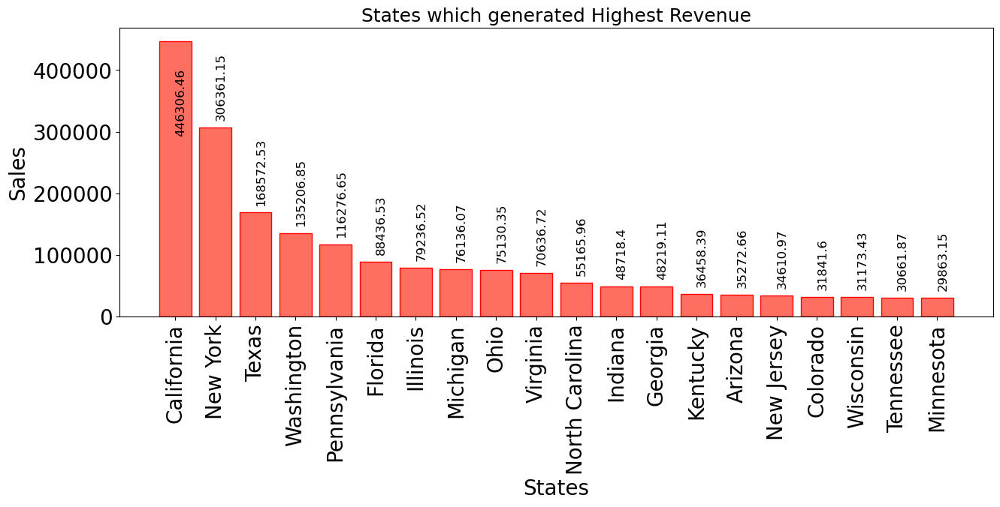

In [28]:
plt.figure(figsize = (15,5)) 
plt.title("States which generated Highest Revenue", fontsize=18) 
plt.bar(Top_states["State"], Top_states["Sales"],color= '#FF6F61',edgecolor='Red', linewidth = 1)
plt.xlabel("States",fontsize=20)
plt.ylabel("Sales",fontsize=20) 
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
for k,v in Top_states["Sales"].items():
    if v>400000:
        plt.text(k,v-150000,''+ str(v), fontsize=12,rotation=90,color='k')
    else:
        plt.text(k,v+15000,''+ str(v), fontsize=12,rotation=90,color='k')

In [29]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales'],
      dtype='object')

In [30]:
df['Segment'].value_counts()

Consumer       5101
Corporate      2953
Home Office    1746
Name: Segment, dtype: int64

<Axes: xlabel='Segment'>

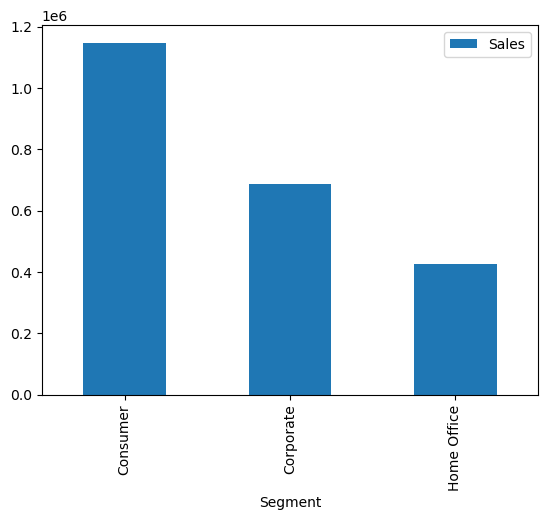

In [31]:
df.groupby(['Segment']).agg({'Sales':'sum'}).plot(kind='bar')

In [32]:
df['Category'].value_counts()

Office Supplies    5909
Furniture          2078
Technology         1813
Name: Category, dtype: int64

In [33]:
state = ['Alabama', 'Arizona' ,'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'Florida', 
         'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
         'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana','Nebraska', 'Nevada', 'New Hampshire',
         'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
         'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
         'West Virginia', 'Wisconsin','Wyoming']
state_code = ['AL','AZ','AR','CA','CO','CT','DE','FL','GA','HI','ID','IL','IN','IA','KS','KY','LA','ME','MD','MA',
              'MI','MN','MS','MO','MT','NE','NV','NH','NJ','NM','NY','NC','ND','OH','OK','OR','PA','RI','SC','SD','TN',
              'TX','UT','VT','VA','WA','WV','WI','WY']
state_df = pd.DataFrame(state, state_code) 
state_df.reset_index(level=0, inplace=True)
state_df.columns = ['State Code','State']
sales = df.groupby(["State"]).sum().sort_values("Sales", ascending=False)
sales.reset_index(level=0, inplace=True)
sales.drop('Postal Code',1, inplace = True)
sales= sales.sort_values('State', ascending=True)
sales.reset_index(inplace = True)
sales.drop('index',1,inplace = True)
sales.insert(1, 'State Code', state_df['State Code'])


C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1783764401.py:13: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1783764401.py:15: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1783764401.py:18: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [34]:
sales['text'] = sales['State']
fig = go.Figure(data=go.Choropleth(
    locations=sales['State Code'],
    text=sales['text'],
    z = sales['Sales'].astype(float), 
    locationmode = 'USA-states', 
    colorscale = 'blues',
    colorbar_title = "Sales",
    
))

fig.update_layout(
    title_text = 'Sales',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [35]:
df.tail(
)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
9795,9796,CA-2017-125920,21/05/2017,28/05/2017,Standard Class,SH-19975,Corporate,United States,Chicago,Illinois,60610.0,Central,OFF-BI-10003429,Office Supplies,Binders,"Cardinal HOLDit! Binder Insert Strips,Extra St...",3.798
9796,9797,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Corporate,United States,Toledo,Ohio,43615.0,East,OFF-AR-10001374,Office Supplies,Art,"BIC Brite Liner Highlighters, Chisel Tip",10.368
9797,9798,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10004977,Technology,Phones,GE 30524EE4,235.188
9798,9799,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10000912,Technology,Phones,Anker 24W Portable Micro USB Car Charger,26.376
9799,9800,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-AC-10000487,Technology,Accessories,SanDisk Cruzer 4 GB USB Flash Drive,10.384


In [36]:
multiple_boxplot(df)

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9800 entries, 0 to 9799
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9800 non-null   int64  
 1   Order ID      9800 non-null   object 
 2   Order Date    9800 non-null   object 
 3   Ship Date     9800 non-null   object 
 4   Ship Mode     9800 non-null   object 
 5   Customer ID   9800 non-null   object 
 6   Segment       9800 non-null   object 
 7   Country       9800 non-null   object 
 8   City          9800 non-null   object 
 9   State         9800 non-null   object 
 10  Postal Code   9800 non-null   float64
 11  Region        9800 non-null   object 
 12  Product ID    9800 non-null   object 
 13  Category      9800 non-null   object 
 14  Sub-Category  9800 non-null   object 
 15  Product Name  9800 non-null   object 
 16  Sales         9800 non-null   float64
dtypes: float64(2), int64(1), object(14)
memory usage: 1.3+ MB


In [38]:
df.drop('Order ID',axis=1,inplace=True)


In [39]:
df.drop('Product ID',axis=1,inplace=True)


In [40]:
df.drop('Postal Code',axis=1,inplace=True)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9800 entries, 0 to 9799
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9800 non-null   int64  
 1   Order Date    9800 non-null   object 
 2   Ship Date     9800 non-null   object 
 3   Ship Mode     9800 non-null   object 
 4   Customer ID   9800 non-null   object 
 5   Segment       9800 non-null   object 
 6   Country       9800 non-null   object 
 7   City          9800 non-null   object 
 8   State         9800 non-null   object 
 9   Region        9800 non-null   object 
 10  Category      9800 non-null   object 
 11  Sub-Category  9800 non-null   object 
 12  Product Name  9800 non-null   object 
 13  Sales         9800 non-null   float64
dtypes: float64(1), int64(1), object(12)
memory usage: 1.1+ MB


In [42]:
df['Order Date'] = pd.to_datetime(df['Order Date'])


C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\506715213.py:1: UserWarning:

Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.



In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9800 entries, 0 to 9799
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Row ID        9800 non-null   int64         
 1   Order Date    9800 non-null   datetime64[ns]
 2   Ship Date     9800 non-null   object        
 3   Ship Mode     9800 non-null   object        
 4   Customer ID   9800 non-null   object        
 5   Segment       9800 non-null   object        
 6   Country       9800 non-null   object        
 7   City          9800 non-null   object        
 8   State         9800 non-null   object        
 9   Region        9800 non-null   object        
 10  Category      9800 non-null   object        
 11  Sub-Category  9800 non-null   object        
 12  Product Name  9800 non-null   object        
 13  Sales         9800 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(11)
memory usage: 1.1+ MB


# count of seles per date 

In [44]:
sales=df.groupby('Order Date')[['Sales']].sum()
sales

,Sales
Order Date,
2015-01-02,468.9000
2015-01-03,2203.1510
2015-01-04,119.8880
2015-01-06,5188.5200
2015-01-07,601.0240
...,...
2018-12-26,814.5940
2018-12-27,177.6360
2018-12-28,1657.3508


<Axes: xlabel='Order Date'>

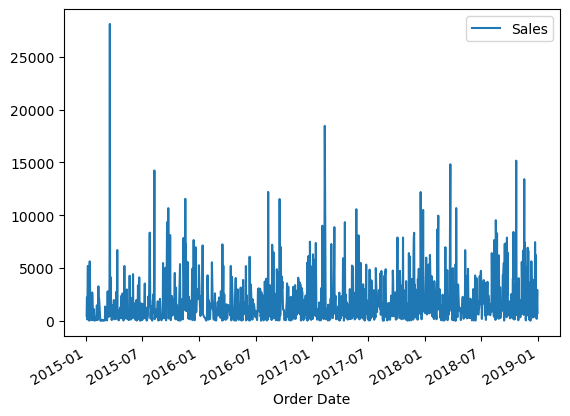

In [45]:
sales.plot()

In [46]:
sales.index

DatetimeIndex(['2015-01-02', '2015-01-03', '2015-01-04', '2015-01-06',
               '2015-01-07', '2015-01-08', '2015-01-09', '2015-01-10',
               '2015-01-11', '2015-01-12',
               ...
               '2018-12-21', '2018-12-22', '2018-12-23', '2018-12-24',
               '2018-12-25', '2018-12-26', '2018-12-27', '2018-12-28',
               '2018-12-29', '2018-12-30'],
              dtype='datetime64[ns]', name='Order Date', length=1230, freq=None)

In [47]:
sales['day_name']=sales.index.day_name()
sales

,Sales,day_name
Order Date,,
2015-01-02,468.9000,Friday
2015-01-03,2203.1510,Saturday
2015-01-04,119.8880,Sunday
2015-01-06,5188.5200,Tuesday
2015-01-07,601.0240,Wednesday
...,...,...
2018-12-26,814.5940,Wednesday
2018-12-27,177.6360,Thursday
2018-12-28,1657.3508,Friday


In [48]:
sales['day_name'].value_counts()

Tuesday      196
Monday       192
Sunday       189
Saturday     186
Wednesday    182
Friday       143
Thursday     142
Name: day_name, dtype: int64

In [49]:
total_per_day = sales.groupby('day_name')['Sales'].sum()
total_per_day

day_name
Friday       257430.3623
Monday       355652.7196
Saturday     394511.1171
Sunday       322770.8031
Thursday     228501.1603
Tuesday      369922.1088
Wednesday    332748.5115
Name: Sales, dtype: float64

<Axes: xlabel='day_name'>

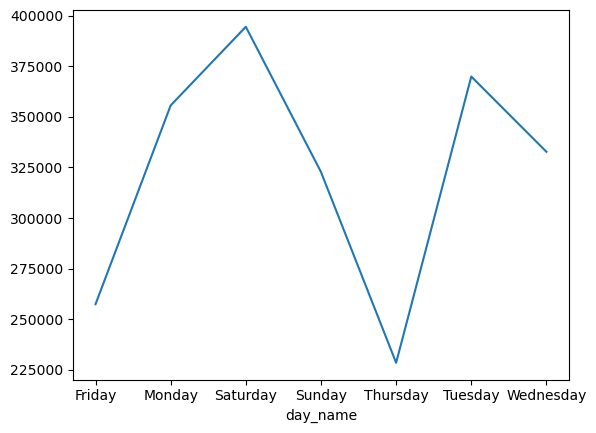

In [50]:
total_per_day.plot()

In [51]:
sales['month_name']=sales.index.month_name()
sales


,Sales,day_name,month_name
Order Date,,,
2015-01-02,468.9000,Friday,January
2015-01-03,2203.1510,Saturday,January
2015-01-04,119.8880,Sunday,January
2015-01-06,5188.5200,Tuesday,January
2015-01-07,601.0240,Wednesday,January
...,...,...,...
2018-12-26,814.5940,Wednesday,December
2018-12-27,177.6360,Thursday,December
2018-12-28,1657.3508,Friday,December


In [52]:
#total_per_month=sales.groupby(by='month_name').sum()[['Sales']]
#total_per_month
df['year_seles'] = df['Order Date'].dt.year
df['month_seles'] = df['Order Date'].dt.month_name()

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\4019450904.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



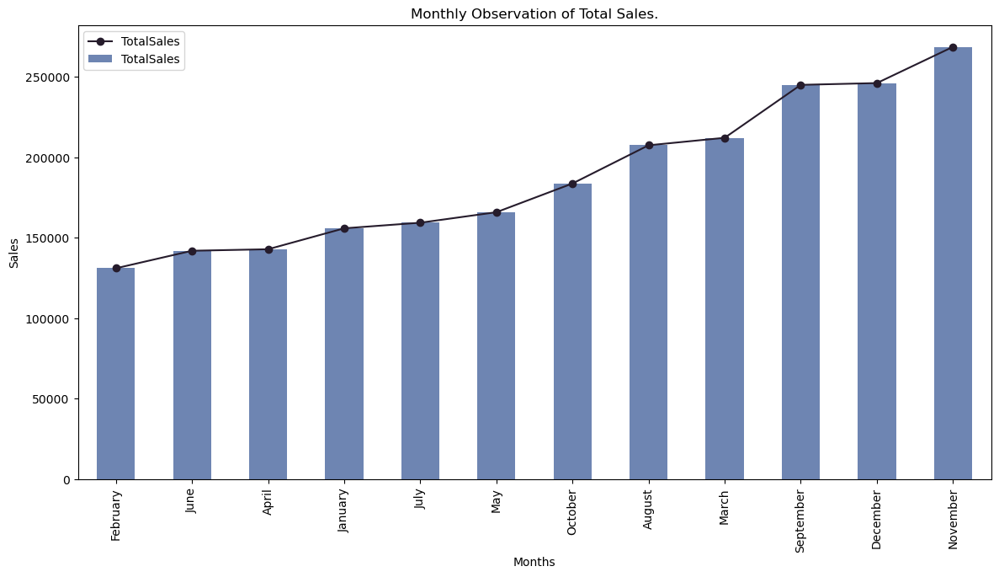

In [53]:
# Monthly observation of Sales Pattern.
monthSales_data = df.groupby(by='month_seles').sum()['Sales']
monthSales_data = monthSales_data.sort_values()

# plot
monthSales_data.plot(kind='line', figsize=(14, 7), color="#261C2C", marker='o', label='TotalSales')
monthSales_data.plot(kind='bar', figsize=(14, 7), color="#6E85B2", label='TotalSales')

plt.xlabel('Months')
plt.ylabel("Sales")
plt.title("Monthly Observation of Total Sales.")

plt.legend()
plt.show()

In [54]:
df_1 = df.groupby('year_seles')[['month_seles']].value_counts().unstack().T
df_1

year_seles,2015,2016,2017,2018
month_seles,,,,
April,121,159,186,225
August,145,170,236,248
December,240,240,264,321
February,84,102,122,228
January,126,86,154,209
July,154,128,201,241
June,135,149,180,220
March,161,144,190,302
May,146,174,257,241


## Resampling

In [55]:
weekly_date = (sales.resample("1W").sum())
weekly_date

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\3050401458.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Sales
Order Date,
2015-01-04,2791.9390
2015-01-11,11129.8340
2015-01-18,9754.9230
2015-01-25,3092.5440
2015-02-01,2059.0140
...,...
2018-12-02,21565.0600
2018-12-09,7261.7420
2018-12-16,14181.0200


<Axes: xlabel='Order Date'>

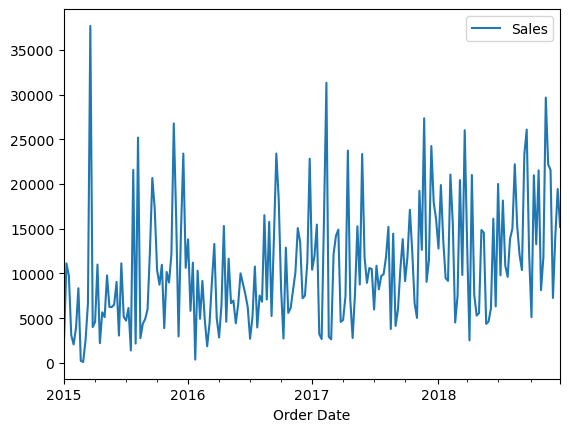

In [56]:
weekly_date.plot()

In [57]:
monthly_date = (sales.resample("1m").sum())
monthly_date

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_7812\1879844250.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Sales
Order Date,
2015-01-31,28828.2540
2015-02-28,12588.4840
2015-03-31,54027.6920
2015-04-30,24710.0160
2015-05-31,29520.4900
2015-06-30,29181.3346
2015-07-31,35194.5580
2015-08-31,37349.2655
2015-09-30,65956.3998


# Modeling

In [58]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 8, 6
from statsmodels.graphics.tsaplots import plot_predict
from sklearn import metrics 

In [59]:
def ACF_and_PACF(data):
    fig = plt.figure(figsize=  (10,6))
    ax1 = fig.add_subplot(211)
    fig = plot_acf(data , lags = 30 , ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = plot_pacf(data , lags = 20, ax=ax2)

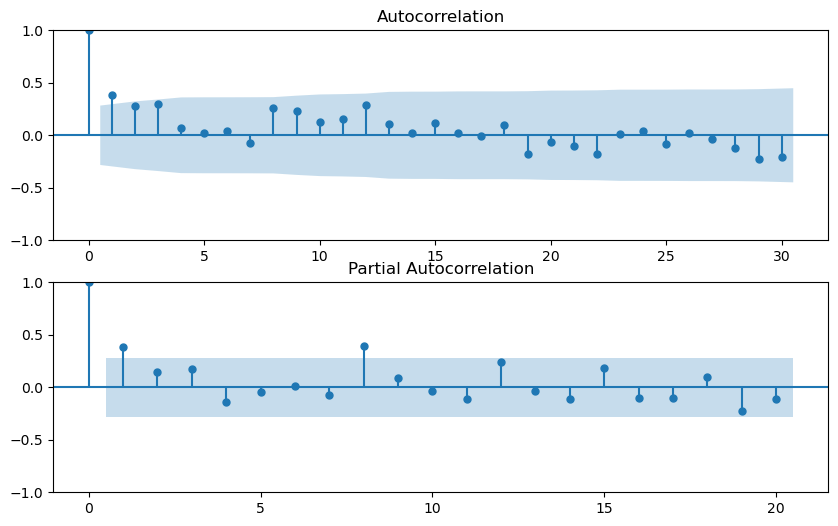

In [60]:
ACF_and_PACF(monthly_date['Sales'])

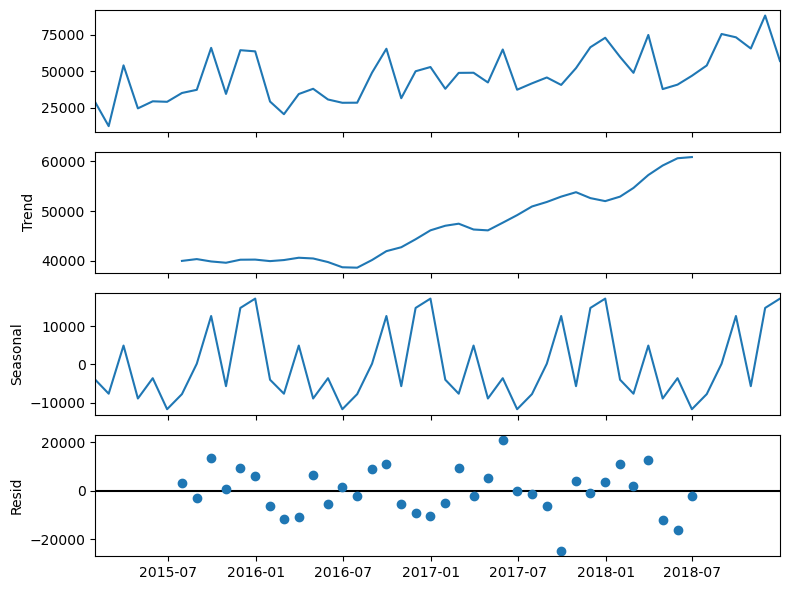

In [61]:
decomposition = sm.tsa.seasonal_decompose (monthly_date , model = 'additive')
decomposition.plot()
plt.show()

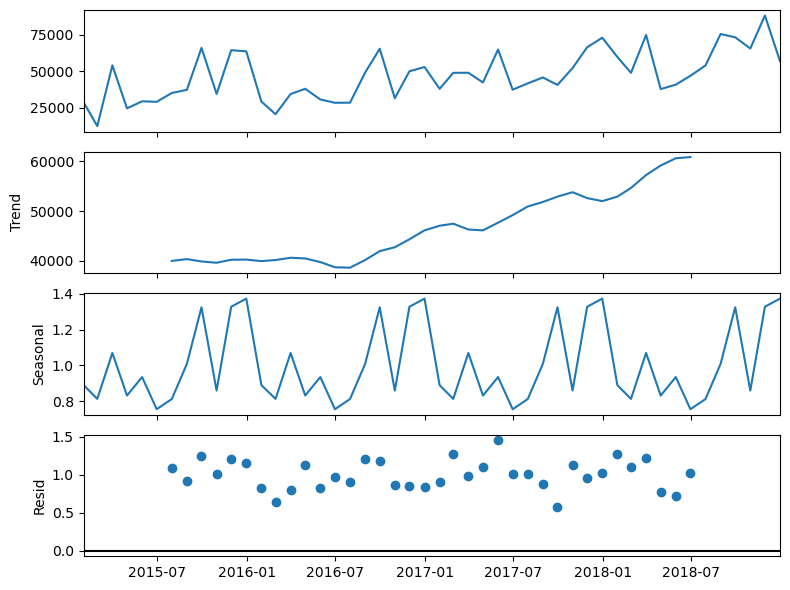

In [62]:
decomposition = sm.tsa.seasonal_decompose (monthly_date , model ='multiplicative' )
decomposition.plot()
plt.show()

# check if data is stationary

In [63]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=4).mean()
    movingSTD = timeseries.rolling(window=4).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    std = plt.plot(movingSTD, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['Sales'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

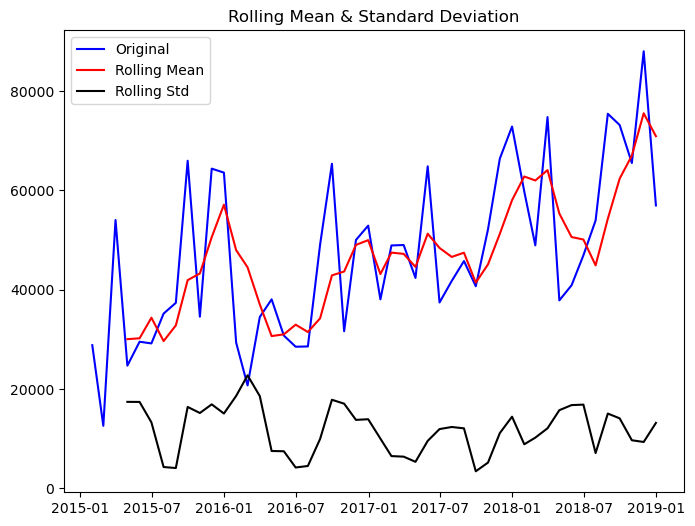

Results of Dickey Fuller Test:
Test Statistic                 -1.145082
p-value                         0.696763
Lags Used                       7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64


In [64]:
test_stationarity(monthly_date)

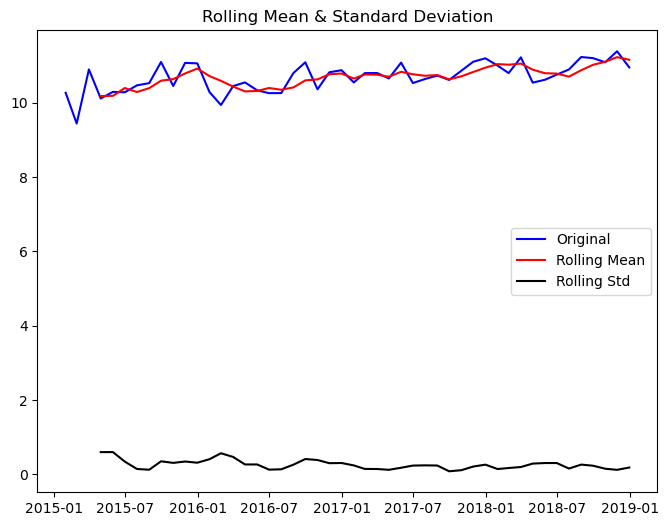

Results of Dickey Fuller Test:
Test Statistic                 -1.458212
p-value                         0.554073
Lags Used                       7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64


In [65]:
df_logScale = np.log(monthly_date)
test_stationarity(df_logScale)

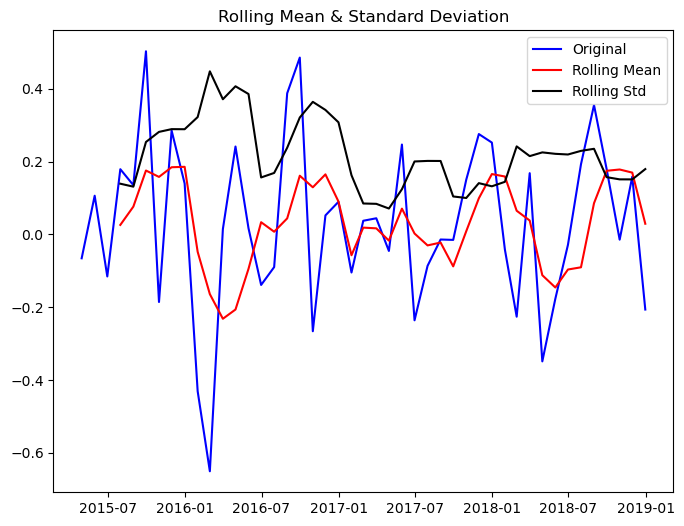

Results of Dickey Fuller Test:
Test Statistic                 -4.906655
p-value                         0.000034
Lags Used                       6.000000
Number of Observations Used    38.000000
Critical Value (1%)            -3.615509
Critical Value (5%)            -2.941262
Critical Value (10%)           -2.609200
dtype: float64


In [67]:
rolmean = df_logScale.rolling(window=4).mean()
rolstd = df_logScale.rolling(window=4).std()
datasetLogScaleMinusMrolling = df_logScale - rolmean
datasetLogScaleMinusMrolling.dropna(inplace=True)
test_stationarity(datasetLogScaleMinusMrolling)

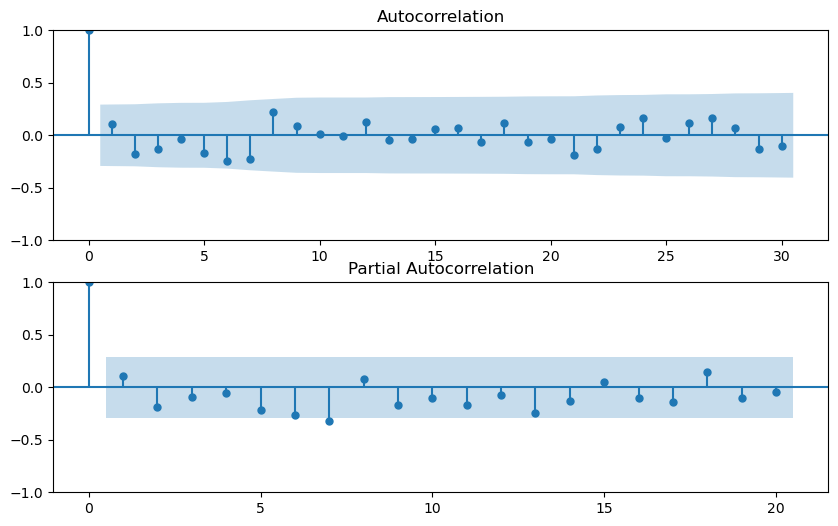

In [68]:
ACF_and_PACF(datasetLogScaleMinusMrolling['Sales'])

In [69]:
monthly_date.shape

(48, 1)

In [70]:
ytrain=monthly_date[0:36]
ytest=monthly_date[36:48]

In [71]:
ytrain

,Sales
Order Date,
2015-01-31,28828.2540
2015-02-28,12588.4840
2015-03-31,54027.6920
2015-04-30,24710.0160
2015-05-31,29520.4900
2015-06-30,29181.3346
2015-07-31,35194.5580
2015-08-31,37349.2655
2015-09-30,65956.3998


In [72]:
ytest

,Sales
Order Date,
2018-01-31,59767.0910
2018-02-28,48928.8334
2018-03-31,74748.6238
2018-04-30,37849.2156
2018-05-31,40882.4464
2018-06-30,46912.8475
2018-07-31,53942.7755
2018-08-31,75408.7840
2018-09-30,73153.3640


C:\Users\midoel3ila\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -384.336
Date:                Wed, 04 Oct 2023   AIC                            780.672
Time:                        15:06:39   BIC                            790.004
Sample:                    01-31-2015   HQIC                           783.893
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5565      0.180     -8.635      0.000      -1.910      -1.203
ar.L2         -0.6536      0.165     -3.961      0.000      -0.977      -0.330
ma.L1          1.1173      0.343      3.257      0.0

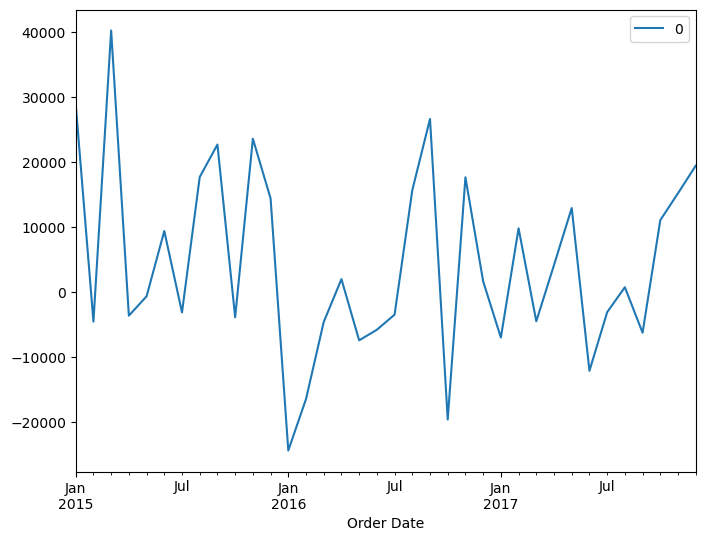

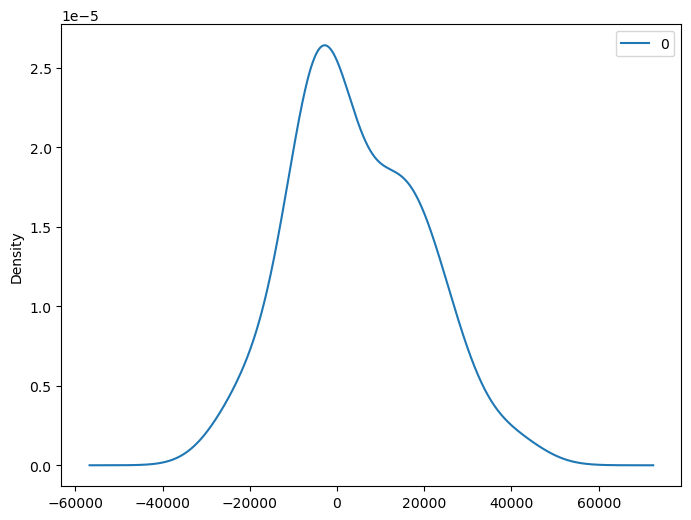

                  0
count     36.000000
mean    4493.940558
std    14514.232742
min   -24418.860405
25%    -4605.488331
50%     1157.537443
75%    15281.397264
max    40194.533965


In [73]:
from statsmodels.tsa.arima_model import ARIMA
model=sm.tsa.arima.ARIMA(ytrain,order=(2,1,3))
arimamodel=model.fit()
print(arimamodel.summary())
res = pd.DataFrame(arimamodel.resid)
res.plot()
plt.show()
res.plot(kind = 'kde')
plt.show()
print(res.describe())

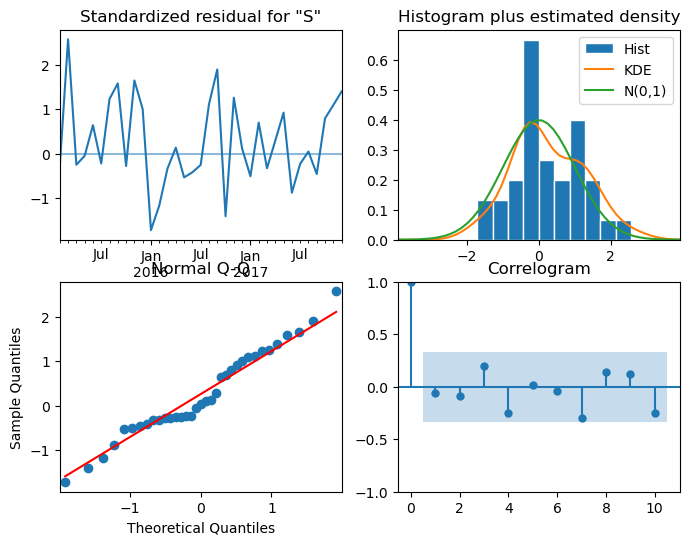

In [74]:
arimamodel.plot_diagnostics()
plt.show()

In [75]:
y_predict=arimamodel.predict(36,47
                            
                            )
y_predict

2018-01-31    61254.470357
2018-02-28    57591.759129
2018-03-31    57388.236040
2018-04-30    60099.063652
2018-05-31    56012.765721
2018-06-30    60601.100368
2018-07-31    56130.405385
2018-08-31    60089.852440
2018-09-30    56849.255732
2018-10-31    59305.148102
2018-11-30    57600.765237
2018-12-31    58648.349409
Freq: M, Name: predicted_mean, dtype: float64

In [76]:
print(metrics.mean_absolute_percentage_error(ytest , y_predict))


0.2183474458494128


In [77]:
pip install pmdarima

Note: you may need to restart the kernel to use updated packages.


In [78]:
import pmdarima as pm

model = pm.auto_arima(monthly_date, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=1,  max_d = 1 ,        # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1045.560, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1059.945, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1048.647, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1039.261, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1058.005, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1047.284, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1042.714, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 0.382 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   48
Model:               SARIMAX(0, 1, 1)   Log Likelihood                -516.630
Date:                Wed, 04 Oct 2023   AIC                           1039.261
Time:                        15:06:48   B

In [79]:
from statsmodels.tsa.stattools import acf

# Create Training and Test
train = monthly_date[:36]
test = monthly_date[36:]

C:\Users\midoel3ila\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning:

Unknown keyword arguments: dict_keys(['alpha']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.



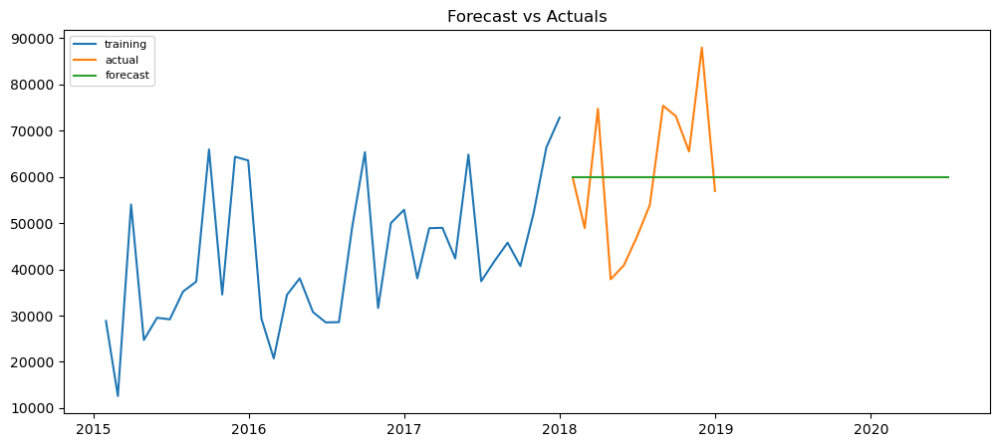

2018-01-31    59933
2018-02-28    59933
2018-03-31    59933
2018-04-30    59933
2018-05-31    59933
2018-06-30    59933
2018-07-31    59933
2018-08-31    59933
2018-09-30    59933
2018-10-31    59933
2018-11-30    59933
2018-12-31    59933
2019-01-31    59933
2019-02-28    59933
2019-03-31    59933
2019-04-30    59933
2019-05-31    59933
2019-06-30    59933
2019-07-31    59933
2019-08-31    59933
2019-09-30    59933
2019-10-31    59933
2019-11-30    59933
2019-12-31    59933
2020-01-31    59933
2020-02-29    59933
2020-03-31    59933
2020-04-30    59933
2020-05-31    59933
2020-06-30    59933
Freq: M, Name: predicted_mean, dtype: int32


In [80]:
model = sm.tsa.arima.ARIMA(train, order=(0,1,1))  
fitted = model.fit()  
fc= fitted.forecast(steps=30, alpha=0.05) 
fc_series = pd.Series(fc)
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()
print(fc.astype('int'))
